In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
from pandas_profiling import ProfileReport


import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D

from sklearn import preprocessing



## Global values of the Plot

In [57]:
plt.rcParams["figure.figsize"] = (10,5)
plt.rcParams.update({'font.size': 22})

## Get all the data files

In [3]:
logdir = "/Users/srivatsankrishnan/workspace/harvard-edge/Fall 2021/arch-gym/logs/random_walk"
os.chdir(logdir)
datafiles = glob.glob("*.csv")
print(datafiles)

['Random_Walk_stream.csv', 'Random_Walk_random.csv', 'Random_Walk_ddr3_example.csv']


## Read it in a DF

In [42]:
df_stream = pd.read_csv(os.path.join(logdir, datafiles[0]))
df_random = pd.read_csv(os.path.join(logdir, datafiles[1]))
df_ddr3_example = pd.read_csv(os.path.join(logdir, datafiles[2]))

profile_stream = ProfileReport(df_stream, title="Energy, Power, Latency profiles")
profile_random = ProfileReport(df_stream, title="Energy, Power, Latency profiles")
profile_ddr3_example = ProfileReport(df_stream, title="Energy, Power, Latency profiles")

## Summary of Stream Workload

In [43]:
profile_stream

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Summary of random address workload

In [44]:
profile_random

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [26]:
def normalize(data):
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(data)
    return x_scaled

In [27]:
max_active_transactions = df['MaxActiveTransactions'].to_numpy()
latency = df['Latency'].to_numpy()
power= df['Power'].to_numpy()
energy = df['Energy'].to_numpy()

In [35]:
latency_scaled = normalize(latency.reshape(-1,1))
power_scaled = normalize(power.reshape(-1,1))
energy_scaled = normalize(energy.reshape(-1,1))


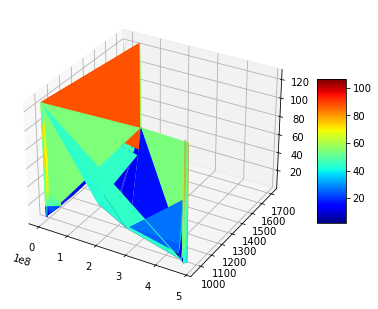

In [9]:
fig = plt.figure()
ax = Axes3D(fig)
surf = ax.plot_trisurf(latency, power,max_active_transactions ,cmap=cm.jet, linewidth=0.1)
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()


## Energy variations across different workloads

Text(0, 0.5, 'Energy (J)')

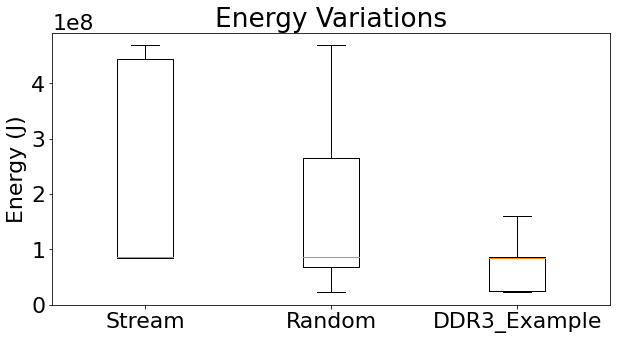

In [58]:
fig4, ax4 = plt.subplots()
ax4.set_title('Energy Variations')
ax4.boxplot([df_stream['Energy'],df_random['Energy'],df_ddr3_example['Energy']],showfliers=False)
plt.xticks([1, 2, 3], ["Stream", "Random", "DDR3_Example"], rotation=0)
plt.ylabel("Energy (J)")

## Latency Variations across different workloads

Text(0, 0.5, 'Latency (ns)')

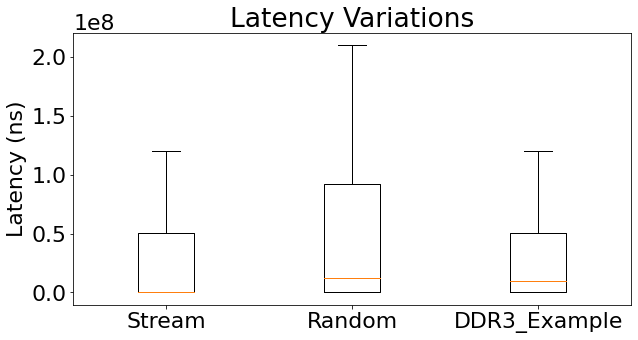

In [61]:
fig4, ax4 = plt.subplots()
ax4.set_title('Latency Variations')
ax4.boxplot([df_stream['Latency'],df_random['Latency'],df_ddr3_example['Latency']],showfliers=False)
plt.xticks([1, 2, 3], ["Stream", "Random", "DDR3_Example"], rotation=0)
plt.ylabel("Latency (ns)")